# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core

!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")

!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44090 sha256=a4d45940d57929edeb296b034e49db57ff9c518a3dda0c72a6b3244280e7d710
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
flax 0.6.9 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatibl

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Run a pre-trained detectron2 model

In [5]:
# cfg = get_cfg()
# # add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# # Find a model from detectron2's model zoo
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
# predictor = DefaultPredictor(cfg)


[06/14 15:40:10 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:01, 164MB/s]                           


# Train on a custom dataset

In [4]:
!pip install roboflow

VERSION = 2

from roboflow import Roboflow
rf = Roboflow(api_key="7tISFpxELvGi0rjvqo2E")
project = rf.workspace("shiitake-harvest").project("shiitake-harvest")
dataset = project.version(2).download("coco")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 682.2/682.2 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.0 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=8cb7a35d093621ee228342a5c62850e38d22866c7dc0e4f623be32acf12144a8
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 5.1
    Uninstalling PyYAML-5.1:
      Successfully uninstalled PyYAML-5.1
  Attempting uninstall: pyparsing
    F

loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to Shiitake-Harvest-2 in coco:: 100%|██████████| 151/151 [00:00<00:00, 253.21it/s]


In [5]:

from detectron2.data.datasets import register_coco_instances

register_coco_instances("shiitake_train", {}, f"/content/Shiitake-Harvest-2/train/_annotations.coco.json", f"/content/Shiitake-Harvest-2/train/")
register_coco_instances("shiitake_valid", {}, f"/content/Shiitake-Harvest-2/valid/_annotations.coco.json", f"/content/Shiitake-Harvest-2/valid/")
register_coco_instances("shiitake_test", {}, f"/content/Shiitake-Harvest-2/test/_annotations.coco.json", f"/content/Shiitake-Harvest-2/test/")


To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



WARNING [06/14 15:54:49 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/14 15:54:49 d2.data.datasets.coco]: Loaded 118 images in COCO format from /content/Shiitake-Harvest-2/train/_annotations.coco.json


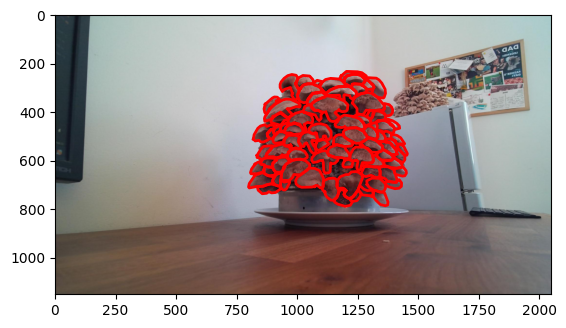

In [6]:
from matplotlib import pyplot as plt
from PIL import Image

dataset_train = DatasetCatalog.get("shiitake_train")
fig, ax = plt.subplots()
dataset_dict = random.choice(dataset_train)
im = Image.open(dataset_dict['file_name'])
ax.imshow(im)
for ann in dataset_dict['annotations']:
    for poly in ann['segmentation']:
        x = poly[0::2]
        y = poly[1::2]
        ax.plot(x,y, linewidth=2, color='red')

In [7]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("shiitake_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/14 15:54:57 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 129MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[06/14 15:54:59 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)


[06/14 15:55:22 d2.utils.events]:  eta: 0:27:44  iter: 19  total_loss: 5.001  loss_cls: 1.198  loss_box_reg: 0.2644  loss_mask: 0.6959  loss_rpn_cls: 2.589  loss_rpn_loc: 0.2124    time: 0.5688  last_time: 0.5790  data_time: 0.0544  last_data_time: 0.0102   lr: 4.9953e-06  max_mem: 2577M
[06/14 15:55:39 d2.utils.events]:  eta: 0:27:31  iter: 39  total_loss: 3.214  loss_cls: 1.144  loss_box_reg: 0.4867  loss_mask: 0.6915  loss_rpn_cls: 0.7327  loss_rpn_loc: 0.1753    time: 0.6339  last_time: 0.5797  data_time: 0.0132  last_data_time: 0.0089   lr: 9.9902e-06  max_mem: 2577M
[06/14 15:55:50 d2.utils.events]:  eta: 0:27:21  iter: 59  total_loss: 2.787  loss_cls: 1.026  loss_box_reg: 0.6631  loss_mask: 0.6812  loss_rpn_cls: 0.2073  loss_rpn_loc: 0.1866    time: 0.6096  last_time: 0.5683  data_time: 0.0143  last_data_time: 0.0186   lr: 1.4985e-05  max_mem: 2578M
[06/14 15:56:01 d2.utils.events]:  eta: 0:27:07  iter: 79  total_loss: 2.579  loss_cls: 0.9197  loss_box_reg: 0.7139  loss_mask: 0.

In [8]:
# save model
torch.save(trainer.model.state_dict(), '/content/model_weights.pth')

# download the model weights to local system
from google.colab import files
files.download('/content/model_weights.pth')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [11]:
from detectron2.data.detection_utils import read_image

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[06/14 16:25:03 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


WARNING [06/14 16:25:11 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/14 16:25:11 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/Shiitake-Harvest-2/test/_annotations.coco.json


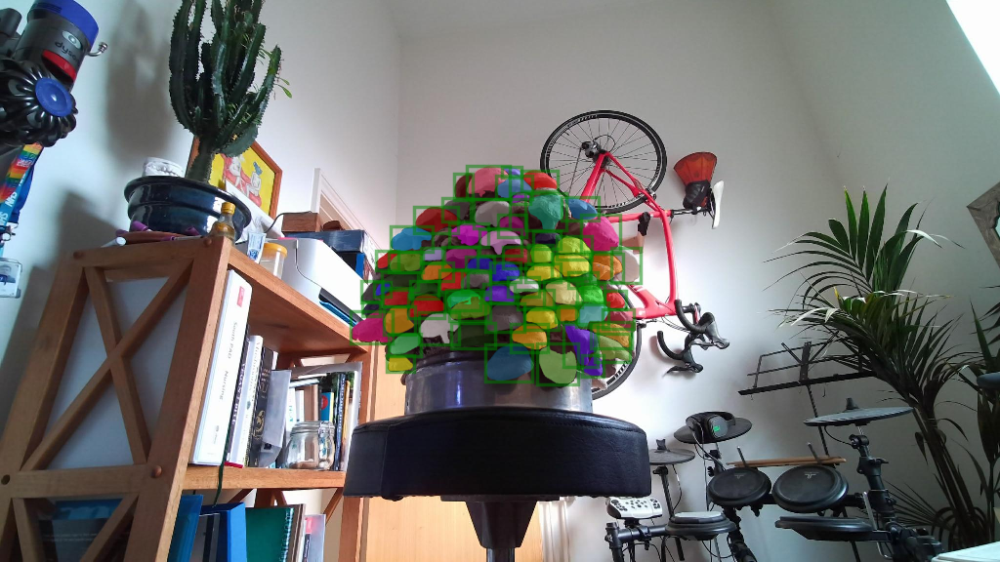

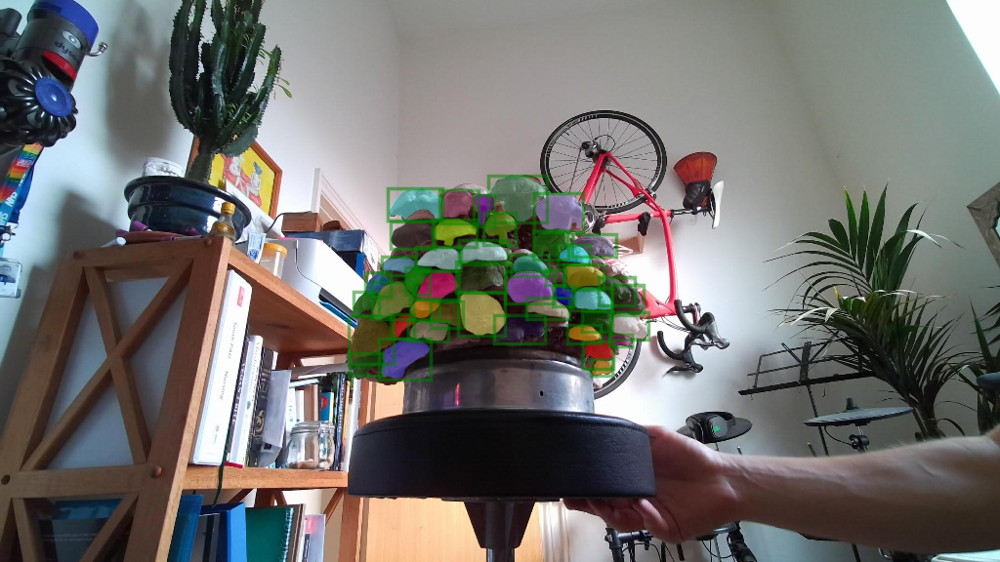

In [12]:
import cv2
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("shiitake_test")
for d in random.sample(dataset_dicts, 2):
# for d in dataset_dicts:
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("shiitake_test"),   # pass metadata of the dataset for visualizer
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW
    )

    # Boxes
    for box in outputs["instances"].pred_boxes.to('cpu'):
        v.draw_box(box)
    # Masks
    for mask in outputs["instances"].pred_masks.to('cpu'):
        v.draw_soft_mask(mask)
    v = v.get_output()
    img =  v.get_image()[:, :, ::-1]
    cv2_imshow(img)


In [13]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("shiitake_test", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "shiitake_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[06/14 16:26:24 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [06/14 16:26:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/14 16:26:24 d2.data.datasets.coco]: Loaded 10 images in COCO format from /content/Shiitake-Harvest-2/test/_annotations.coco.json
[06/14 16:26:24 d2.data.build]: Distribution of instances among all 2 categories:
|   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|
| Shiitake-Mu.. | 0            | Shiitake-Mu.. | 666          |
|               |              |               |              |
|     total     | 666          |               |              |
[06/14 16:26:24 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/14 16:26:24 d2.data.common]: Se